## Mount Drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
%cd /content/gdrive/My\ Drive/Projects/3DGan

/content/gdrive/My Drive/Projects/3DGan


## Open3D Library

In [ ]:
!pip install open3d

     |████████████████████████████████| 103.6MB 40kB/s 


In [ ]:
import open3d as o3d

#3DDFA

In [ ]:
# !git clone https://github.com/cleardusk/3DDFA.git  # or git@github.com:cleardusk/3DDFA.git
# %cd 3DDFA

In [ ]:
# %cd utils/cython
# !python3 setup.py build_ext -i

In [ ]:
# !./script.sh

In [ ]:
SOURCE = "/content/gdrive/My Drive/Projects/3DGan/AFLW2000/"
DESTINATION = "/content/gdrive/My Drive/Projects/3DGan/Data/"

In [ ]:
import os
print("Training Data = ",len(os.listdir(DESTINATION + "Training/"))//2)
print("Testing Data = ",len(os.listdir(DESTINATION + "Testing/"))//2)
print("Validation Data = ",len(os.listdir(DESTINATION + "Validation/"))//2)

Training Data =  1253
Testing Data =  125
Validation Data =  125


In [ ]:
# import shutil

# SOURCE = "/content/gdrive/My Drive/Projects/3DGan/AFLW2000/"
# DESTINATION = "/content/gdrive/My Drive/Projects/3DGan/Data/"

# i = 0
# for f in sorted(os.listdir(SOURCE)):
#   if f.endswith(".jpg") and len(f.split("_")) == 1:
#     # print(SOURCE + f.split(".")[0] + "_0.ply")
#     k = 0
#     while (os.path.isfile(SOURCE + f.split(".")[0] + "_" + str(k) + ".ply")):
#       print((SOURCE + f.split(".")[0] + "_" + str(k) + ".ply"))
#       print(f)
#       shutil.move((SOURCE + f.split(".")[0] + "_" + str(k) + ".ply"),(DESTINATION + f.split(".")[0] + "_" + str(k) + ".ply"))
#       k+=1

#     if k>0:
#       shutil.move(SOURCE + f,DESTINATION + f)


In [ ]:
DESTINATION = '/content/gdrive/My Drive/Projects/3DGan/Data/Training/'

flag = 0
for f in sorted(os.listdir(DESTINATION)):
  if f.endswith('.jpg'):
    if not os.path.isfile(DESTINATION + f.split(".")[0] + "_" + str(0) + ".ply"):
      print("Some problem")
      flag = 1

if flag==0:
  print("Working Perfectly")

Working Perfectly


In [ ]:
# import shutil

# SOURCE = '/content/gdrive/My Drive/Projects/3DGan/Data/'
# DESTINATION = '/content/gdrive/My Drive/Projects/3DGan/Validation/'
# ct = 0

# for f in sorted(os.listdir(SOURCE))[:250]:
#     shutil.move((SOURCE + f),(DESTINATION + f))
#     ct+=1
# print(ct)


# Download Dataset

In [ ]:
# !wget http://www.cbsr.ia.ac.cn/users/xiangyuzhu/projects/3DDFA/Code/3DDFA.zip

In [ ]:
# !unzip 3DDFA.zip

In [ ]:
# !wget http://3dshapenets.cs.princeton.edu/3DShapeNetsCode.zip

In [ ]:
# !unzip 3DShapeNetsCode.zip

# Imports

In [ ]:
import glob
import os
import time
import numpy as np
import scipy.io as io
import scipy.ndimage as nd
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt

In [ ]:
from tensorflow.keras import Sequential
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import Conv3D, Conv3DTranspose,Conv2DTranspose
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from mpl_toolkits.mplot3d import Axes3D

In [ ]:
import os
import time

import h5py
import keras.backend as K
import matplotlib.pyplot as plt
import numpy as np
from cv2 import imwrite
from keras import Input, Model
# from tensorflow.compat.v1.keras.callbacks import TensorBoard
from keras.layers import Convolution2D, LeakyReLU, BatchNormalization, UpSampling2D, Dropout, Activation, Flatten, Dense, Lambda, Reshape, concatenate
from keras.optimizers import Adam
from tensorflow.keras.applications import MobileNetV2
import tensorflow as tf
from tensorflow.keras.utils import plot_model
from IPython.display import Image
from open3d import JVisualizer
import plotly.graph_objects as go


# Data Exploration

In [ ]:
!pip install pyntcloud
!pip install pyvista


     |████████████████████████████████| 348kB 4.3MB/s 
     |████████████████████████████████| 1.2MB 4.3MB/s 
     |████████████████████████████████| 103.4MB 41kB/s 
     |████████████████████████████████| 153kB 36.2MB/s 


In [ ]:
from pyntcloud import PyntCloud


print("Load a ply point cloud, print it, and render it")
pcd = o3d.io.read_point_cloud(DESTINATION + "image00551_0.ply")
print(pcd)
print(np.asarray(pcd.points).shape)
print(np.asarray(pcd.points))
x = np.asarray(pcd.points)
print(np.amax(np.asarray(pcd.points)))
# o3d.visualization.draw_geometries([pcd],"3D View")

# FROM Open3D
fig = go.Figure(data=[go.Mesh3d(x=x[:,0], y=x[:,1], z=x[:,2], color='#bb907d', opacity=1.0)])
fig.show()


INFO - 2020-11-24 15:51:29,782 - utils - NumExpr defaulting to 2 threads.


Load a ply point cloud, print it, and render it
PointCloud with 53215 points.
(53215, 3)
[[ 141.4692  223.4675  -36.4754]
 [ 141.5981  223.7953  -36.553 ]
 [ 141.7299  224.1219  -36.6331]
 ...
 [ 256.6425  247.2701 -218.4859]
 [ 256.1119  246.7498 -219.1985]
 [ 255.5807  246.24   -219.8794]]
396.8486


In [ ]:
!pip install pptk

     |████████████████████████████████| 24.8MB 138kB/s 


(450, 450, 3)


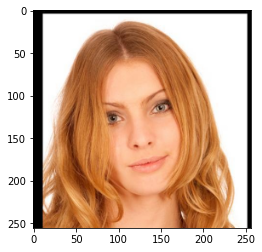

In [ ]:
import cv2
img = cv2.imread((DESTINATION + "image00555.jpg"))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

print(img.shape)

x = cv2.resize(img,(256,256))
plt.imshow(x)
# imwrite('abc.png',x)
# print((x))
x = x /255.0
# print(x)
x = x*255.0
x = x.astype(int)
# plt.imshow(x)

# Generator

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 128, 128, 64) 3136        input_1[0][0]                    
__________________________________________________________________________________________________
leaky_re_lu (LeakyReLU)         (None, 128, 128, 64) 0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 64, 64, 128)  131200      leaky_re_lu[0][0]                
_______________________________________________________________________________________

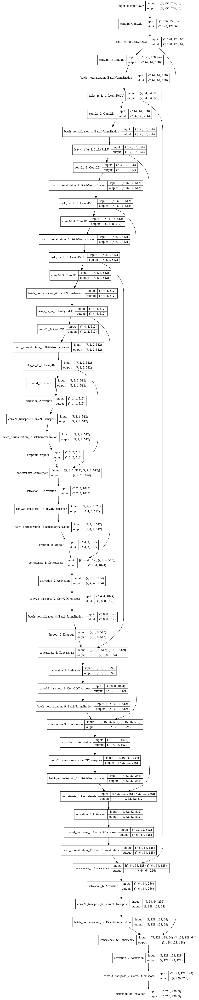

In [ ]:
# example of defining a u-net encoder-decoder generator model
from keras.initializers import RandomNormal
from keras.models import Model
from keras.models import Input
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate
from keras.layers import Dropout
from keras.layers import BatchNormalization
from keras.layers import LeakyReLU
from keras.utils.vis_utils import plot_model

# define an encoder block
def define_encoder_block(layer_in, n_filters, batchnorm=True):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# add downsampling layer
	g = Conv2D(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
	# conditionally add batch normalization
	if batchnorm:
		g = BatchNormalization()(g, training=True)
	# leaky relu activation
	g = LeakyReLU(alpha=0.2)(g)
	return g

# define a decoder block
def decoder_block(layer_in, skip_in, n_filters, dropout=True):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# add upsampling layer
	g = Conv2DTranspose(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
	# add batch normalization
	g = BatchNormalization()(g, training=True)
	# conditionally add dropout
	if dropout:
		g = Dropout(0.5)(g, training=True)
	# merge with skip connection
	g = Concatenate()([g, skip_in])
	# relu activation
	g = Activation('relu')(g)
	return g

# define the standalone generator model
def define_generator(image_shape=(256,256,3)):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# image input
	in_image = Input(shape=image_shape)
	# encoder model: C64-C128-C256-C512-C512-C512-C512-C512
	e1 = define_encoder_block(in_image, 64, batchnorm=False)
	e2 = define_encoder_block(e1, 128)
	e3 = define_encoder_block(e2, 256)
	e4 = define_encoder_block(e3, 512)
	e5 = define_encoder_block(e4, 512)
	e6 = define_encoder_block(e5, 512)
	e7 = define_encoder_block(e6, 512)
	# bottleneck, no batch norm and relu
	b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
	b = Activation('relu')(b)
	# decoder model: CD512-CD1024-CD1024-C1024-C1024-C512-C256-C128
	d1 = decoder_block(b, e7, 512)
	d2 = decoder_block(d1, e6, 512)
	d3 = decoder_block(d2, e5, 512)
	d4 = decoder_block(d3, e4, 512, dropout=False)
	d5 = decoder_block(d4, e3, 256, dropout=False)
	d6 = decoder_block(d5, e2, 128, dropout=False)
	d7 = decoder_block(d6, e1, 64, dropout=False)
	# output
	g = Conv2DTranspose(3, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7)
	out_image = Activation('tanh')(g)
	# define model
	model = Model(in_image, out_image)
	return model

# define image shape
image_shape = (256,256,3)
# create the model
model = define_generator(image_shape)
# summarize the model
model.summary()
# plot the model
plot_model(model, to_file='Generator.png', show_shapes=True, show_layer_names=True)

# Discriminator

Model: "functional_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_7 (Concatenate)     (None, 256, 256, 6)  0           input_2[0][0]                    
                                                                 input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_8 (Conv2D)               (None, 128, 128, 64) 6208        concatenate_7[0][0]   

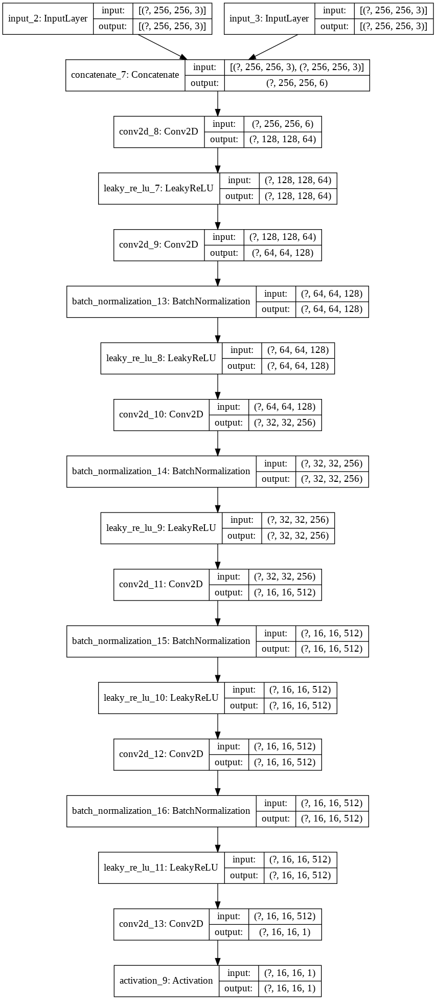

In [ ]:
# example of defining a 70x70 patchgan discriminator model
from keras.optimizers import Adam
from keras.initializers import RandomNormal
from keras.models import Model
from keras.models import Input
from keras.layers import Conv2D
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate
from keras.layers import BatchNormalization
from keras.utils.vis_utils import plot_model
 
# define the discriminator model
def define_discriminator(image_shape, target_shape):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# source image input
	in_src_image = Input(shape=image_shape)
	# target image input
	in_target_image = Input(shape=target_shape)
	# concatenate images channel-wise
	merged = Concatenate()([in_src_image, in_target_image])
	# C64
	d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(merged)
	d = LeakyReLU(alpha=0.2)(d)
	# C128
	d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C256
	d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C512
	d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# second last output layer
	d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# patch output
	d = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
	patch_out = Activation('sigmoid')(d)
	# define model
	model = Model([in_src_image, in_target_image], patch_out)
	# compile model
	opt = Adam(lr=0.00002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=[0.5])
	return model
 
# define image shape
image_shape = (256,256,3)
target_shape = (256,256,3)

# create the model
model = define_discriminator(image_shape,target_shape)
# summarize the model
model.summary()
# plot the model
plot_model(model, to_file = '/content/gdrive/My Drive/Projects/3DGan/Discriminator.png', show_shapes=True, show_layer_names=True)

# GAN

Model: "functional_9"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
functional_7 (Functional)       (None, 256, 256, 3)  54429315    input_7[0][0]                    
__________________________________________________________________________________________________
functional_5 (Functional)       (None, 16, 16, 1)    6968257     input_7[0][0]                    
                                                                 functional_7[0][0]               
Total params: 61,397,572
Trainable params: 54,419,459
Non-trainable params: 6,978,113
__________________________________________________________________________________________________


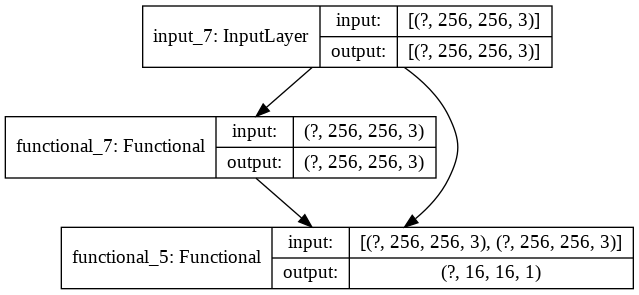

In [ ]:
# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model, image_shape):
	# make weights in the discriminator not trainable
	d_model.trainable = False
	# define the source image
	in_src = Input(shape=image_shape)
	# connect the source image to the generator input
	gen_out = g_model(in_src)
	# connect the source input and generator output to the discriminator input
	dis_out = d_model([in_src, gen_out])
	# src image as input, generated image and classification output
	model = Model(in_src, [dis_out, gen_out])
	# compile model
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss=['binary_crossentropy', 'mae'], optimizer=opt, loss_weights=[1,100])
	return model

# define image shape
image_shape = (256,256,3)
target_shape = (256,256,3)
# define the models
d_model = define_discriminator(image_shape, target_shape)
g_model = define_generator(image_shape)
# define the composite model
gan_model = define_gan(g_model, d_model, image_shape)
# summarize the model
gan_model.summary()
# plot the model
plot_model(gan_model, to_file='GAN.png', show_shapes=True, show_layer_names=True)

# Logs

In [ ]:
def write_log(callback, name, loss, batch_no, logdir):
    """
    Write training summary to TensorBoard
    """
    # for name, value in zip(names, logs):
    summary = tf.summary.create_file_writer(logdir)
    
    with summary.as_default():
      tf.summary.scalar(name, loss, step=batch_no)
    summary.flush()


# Load Dataset

In [ ]:
def load_dataset(data_dir, data_type):
    data_dir_path = os.path.join(data_dir, data_type)

    #point_clouds_ply = All point cloud filenames
    #images_jpg = All image filenames

    point_cloud_paths = [data_dir_path + '/' + f for f in sorted(os.listdir(data_dir_path)) if '.ply' in f]
    images_paths = [data_dir_path + '/' + f for f in sorted(os.listdir(data_dir_path)) if '.jpg' in f]
    # print(np.asarray(o3d.io.read_point_cloud(point_cloud_paths[0]).points))
    point_cloud_shape = np.asarray(o3d.io.read_point_cloud(point_cloud_paths[0]).points).shape
    # print(point_cloud_shape)
    pad_zeros = np.zeros((256*256 - point_cloud_shape[0],3))
    # print(pad_zeros.shape)
    point_clouds = np.asarray([np.concatenate((np.asarray(o3d.io.read_point_cloud(point_cloud_path).points), pad_zeros), axis=0) for point_cloud_path in point_cloud_paths], dtype = np.float32)
    images = np.asarray([cv2.resize(cv2.imread(image_path),(256,256)) for image_path in images_paths], dtype = np.float32)

    # Resize and normalize images
    num_point_clouds = point_clouds.shape[0]
    # print(point_clouds.shape)
    num_images = images.shape[0]
    # print(images.shape)
    # print(np.amax(point_clouds))
    all_point_clouds = point_clouds.reshape((num_point_clouds, 256, 256, 3)) / 500.0

    all_images = images.reshape((num_images, 256, 256, 3)) / 255.0

    #Output = Images, PointClouds
    return all_images, all_point_clouds

# Save and Plot

In [ ]:
def save_images(val_point_clouds_batch, val_images_batch, validation_generated_point_clouds, epoch, base_dir, limit):
    

    val_images_batch = val_images_batch * 255.0
    val_point_clouds_batch = val_point_clouds_batch * 500.0
    validation_generated_point_clouds = validation_generated_point_clouds * 500.0

    # Save some images only
    val_images_batch = val_images_batch[:limit]
        
    val_point_clouds_batch = val_point_clouds_batch[:limit]
    val_point_clouds_batch = val_point_clouds_batch.reshape(limit,256*256,3)
    val_point_clouds_batch = val_point_clouds_batch[:,:53215,:]

    validation_generated_point_clouds = validation_generated_point_clouds[:limit]
    validation_generated_point_clouds = validation_generated_point_clouds.reshape(limit,256*256,3)
    validation_generated_point_clouds = validation_generated_point_clouds[:,:53215,:]

    for i in range(limit):

      pcd = o3d.geometry.PointCloud()
      pcd.points = o3d.utility.Vector3dVector(val_point_clouds_batch[i])
      o3d.io.write_point_cloud( base_dir + "Results/real_" + str(epoch) + '_' + str(i) + '.ply', pcd)

      pcd = o3d.geometry.PointCloud()
      # print(validation_generated_point_clouds[i].shape)
      pcd.points = o3d.utility.Vector3dVector(validation_generated_point_clouds[i])
      o3d.io.write_point_cloud( base_dir + "Results/generated_" + str(epoch) + '_' + str(i) + '.ply', pcd)
      # print(val_images_batch[i].shape)
      imwrite( base_dir + 'Results/image_' + str(epoch) + '_' + str(i) + '.jpg', val_images_batch[i].astype(int))

# Train

### Generate Real and Fake Samples

In [ ]:
# select a batch of random samples, returns images and target
def generate_real_samples(dataset, n_samples, patch_shape):
	# unpack dataset
	trainA, trainB = dataset
	# choose random instances
	ix = np.random.randint(0, trainA.shape[0], n_samples)
	# retrieve selected images
	X1, X2 = trainA[ix], trainB[ix]
	# generate 'real' class labels (1)
	y = np.ones((n_samples, patch_shape, patch_shape, 1)) - np.random.uniform(0,0.1)
	return [X1, X2], y

In [ ]:
# generate a batch of images, returns images and targets
def generate_fake_samples(g_model, samples, patch_shape):
	# generate fake instance
	X = g_model.predict(samples)
	# create 'fake' class labels (0)
	y = np.zeros((len(X), patch_shape, patch_shape, 1)) + np.random.uniform(0,0.1)
	return X, y

## New Train

In [ ]:
%load_ext tensorboard
%tensorboard --logdir "/content/gdrive/My Drive/Projects/3DGan/logs/"

<IPython.core.display.Javascript object>

In [ ]:
# train pix2pix models
def train(d_model, g_model, gan_model, dataset_train, dataset_val, base_dir, n_epochs=1000, n_batch=8, n_patch=16):
	
  epoch = x = 441
  prev_epoch = 0
  # unpack dataset
  trainA, trainB = dataset_train
  validation_images, validation_point_clouds = dataset_val

  # calculate the number of batches per training epoch
  bat_per_epo = int(len(trainA) / n_batch)

  # calculate the number of training iterations
  n_steps = bat_per_epo * n_epochs

  # Tensorboard
  log_dir= base_dir + "logs/{}".format(time.time())
  tensorboard = TensorBoard(log_dir = log_dir)
  tensorboard.set_model(g_model)
  tensorboard.set_model(d_model)
  dis_losses = []
  gen_losses = []

  # manually enumerate epochs
  for i in range(x,n_steps):
    # select a batch of real samples
    [X_realA, X_realB], y_real = generate_real_samples(dataset_train, n_batch, n_patch)
    # generate a batch of fake samples
    X_fakeB, y_fake = generate_fake_samples(g_model, X_realA, n_patch)
    # update discriminator for real samples
    d_loss1 = d_model.train_on_batch([X_realA, X_realB], y_real)
    # update discriminator for generated samples
    d_loss2 = d_model.train_on_batch([X_realA, X_fakeB], y_fake)
    # update the generator
    g_loss, _, _ = gan_model.train_on_batch(X_realA, [y_real, X_realB])
    # summarize performance
    
    d_loss = (d_loss1 + d_loss2)/2
    gen_losses.append(g_loss)
    dis_losses.append(d_loss)

    if i%(bat_per_epo) == 0:
      print('Epoch ' + str(epoch) + ': ' + 'g_loss = ' + str(g_loss) + ' and d_loss = ' + str(d_loss))

      write_log(tensorboard, 'discriminator_loss', np.mean(dis_losses), epoch,log_dir)
      write_log(tensorboard, 'generator_loss', np.mean(gen_losses), epoch,log_dir)
      gen_losses = []
      dis_losses = []
      epoch+=1


    
    if epoch%10 == 0 and prev_epoch != epoch:
      prev_epoch = epoch
      rand_samples = np.random.randint(0, validation_images.shape[0],size=5)
      val_images_batch = validation_images[rand_samples]
      val_point_clouds_batch = validation_point_clouds[rand_samples]

      # Generate images
      validation_generated_point_clouds = g_model.predict(val_images_batch)

      # Save images
      save_images(val_point_clouds_batch, val_images_batch, validation_generated_point_clouds, epoch, base_dir , limit=5)

      # Save models
      g_model.save_weights("models/generator.ckpt")
      d_model.save_weights("models/discriminator.ckpt")
      gan_model.save_weights("models/gan.ckpt")
      print(epoch)
      print("Models and Results Saved.")


# Run

In [ ]:
# load image data
base_dir = '/content/gdrive/My Drive/Projects/3DGan/'
data_dir = base_dir + 'Data/'

dataset_train = load_dataset(data_dir, 'Training')
dataset_val = load_dataset(data_dir, 'Validation')

# define image shape
image_shape = (256,256,3)
target_shape = (256,256,3)

# define the models

# try:
#   opt = Adam(lr=0.0002, beta_1=0.5)

#   d_model = tf.keras.models.load_model('models/Discriminator')
#   # d_model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=[0.5])
#   # print(d_model.optimizer)
#   print(d_model.loss)
#   g_model = tf.keras.models.load_model('models/Generator')

#   # gan_model = tf.keras.models.load_model('models/GAN')
#   gan_model.compile(loss=['binary_crossentropy', 'mae'], optimizer=opt, loss_weights=[1,100])

#   print("Succesfully loaded trained models")
# except:
#   d_model = define_discriminator(image_shape, target_shape)
#   g_model = define_generator(image_shape)
#   gan_model = define_gan(g_model, d_model, image_shape)
#   print("Creating new models...")

d_model = define_discriminator(image_shape, target_shape)
g_model = define_generator(image_shape)
gan_model = define_gan(g_model, d_model, image_shape)

try:
  d_model.load_weights('models/discriminator.ckpt')
  g_model.load_weights('models/generator.ckpt')
  gan_model.load_weights('models/gan.ckpt')
  print("Succesfully loaded trained weights")
except:
  print("Creating new models...")
  pass


# train model
train(d_model, g_model, gan_model, dataset_train, dataset_val, base_dir)

Succesfully loaded trained weights
Epoch 441: g_loss = 0.5571457147598267 and d_loss = 0.08482366241514683
Epoch 442: g_loss = 0.6529693007469177 and d_loss = 0.08472064137458801
Epoch 443: g_loss = 0.4750598073005676 and d_loss = 0.03747754544019699
Epoch 444: g_loss = 0.6214022040367126 and d_loss = 0.08970611914992332
Epoch 445: g_loss = 0.7845484614372253 and d_loss = 0.05022232420742512
Epoch 446: g_loss = 0.579764187335968 and d_loss = 0.0696396641433239
Epoch 447: g_loss = 0.7580430507659912 and d_loss = 0.09316341392695904
Epoch 448: g_loss = 0.48667845129966736 and d_loss = 0.11108229868113995
Epoch 449: g_loss = 0.6725035309791565 and d_loss = 0.13012203201651573
450
Models and Results Saved.
Epoch 450: g_loss = 0.5800114870071411 and d_loss = 0.07836373522877693
Epoch 451: g_loss = 0.5787580013275146 and d_loss = 0.0857663694769144
Epoch 452: g_loss = 0.6755836009979248 and d_loss = 0.09463614597916603
Epoch 453: g_loss = 0.7210314273834229 and d_loss = 0.09931296855211258
E

# Practice

## Training = 496.1595
##Validation = 491.4516
### Testing = 471.8207


In [ ]:
a = np.array(np.random.rand(5,256,256,3))
# a = a.reshape(5,2,1,1)
# print(a)
# a[np.random.randint(0,2,size=3)]
print(a.shape)
b = a.reshape(5,256*256,3)
b = b[:,:53215,:]
b.shape

In [ ]:
a = np.array(np.random.rand(5,2,2,2))
print(a)

a = a.reshape(20,2)
print(a)

b = a.reshape(5,2,2,2)
print(b)
# a[np.random.randint(0,2,size=3)]
# print(a[0][0][1][0])
# a.reshape(5,256*256,3)[0][1][0]